In [11]:
import pandas as pd
import plotly_express as px


import plotly.plotly as py
import plotly.graph_objs as go
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)
from plotly import tools

In [15]:
datafile1= './press_freedom2.csv'
df_ = pd.read_csv(datafile1)
df_

,Country,Edition,Total Score,Status,Year Covered
0,Afghanistan,1994,NaN,NF,1993
1,Afghanistan,1995,90.0,NF,1994
2,Afghanistan,1996,90.0,NF,1995
3,Afghanistan,1997,100.0,NF,1996
4,Afghanistan,1998,100.0,NF,1997
5,Afghanistan,1999,100.0,NF,1998
6,Afghanistan,2000,90.0,NF,1999
7,Afghanistan,2001,95.0,NF,2000
8,Afghanistan,2003,74.0,NF,2002
9,Afghanistan,2004,72.0,NF,2003


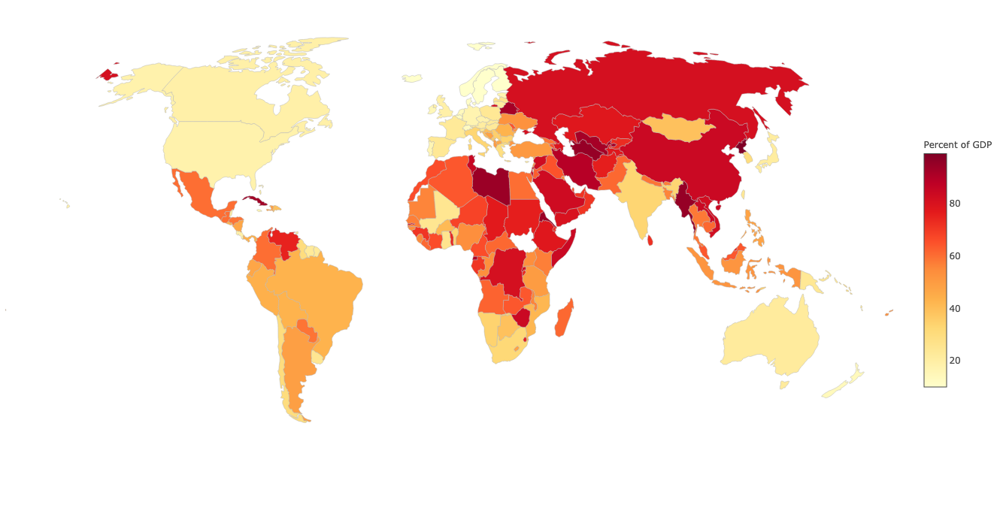

In [12]:
df = df_[df_['Year Covered'] == 2009]

plotmap = [ dict(
        type = 'choropleth',
        locations = df['Country'],
        locationmode = 'country names',
        z = df['Total Score'],
        text = df['Country'],
        colorscale = 'YlOrRd',
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        colorbar =go.choropleth.ColorBar(
            title = 'Percent of GDP',
            len=0.5
        ),
      ) ]

layout = dict(
    margin={"t": 0, "b": 0, "l": 0, "r": 0},
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'natural earth'
        )
    ),
     height=700,
    width=900
)

fig = dict( data=plotmap, layout=layout )
iplot(fig)

In [112]:
import pandas as pd
import numpy as np

import plotly.plotly as py
import plotly.graph_objs as go
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)
from plotly import tools
# import country_converter as coco

In [113]:
datafile= './press-freedom.csv'
df = pd.read_csv(datafile)
df = df.drop('AR_country', 1)
df = df.drop('FA_country', 1)
df = df.drop('ES_country', 1)
df = df.drop('FR_Country', 1)
df = df.drop('ISO', 1)
df = df.drop('Score A', 1)
df = df.drop('Sco Exa', 1)
df = df.drop('Progression RANK', 1)
df = df.drop('Zone', 1)


# replace every comma on the value column
df['Score 2019'] = [x.replace(',', '.') for x in df['Score 2019']]
df['Score 2018'] = [x.replace(',', '.') for x in df['Score 2018']]
df.sample(9)

,Rank2019,EN_country,Score 2019,Rank 2018,Score 2018
14,15,Ireland,15,16,14.59
131,132,Oman,43.42,127,40.67
79,80,Bhutan,29.81,94,30.73
135,136,Thailand,44.1,140,44.31
28,29,Spain,21.99,31,20.51
8,9,Belgium,12.07,7,13.16
166,167,Bahrain,61.31,166,60.85
21,22,Samoa,18.25,22,16.69
12,13,Germany,14.6,15,14.39


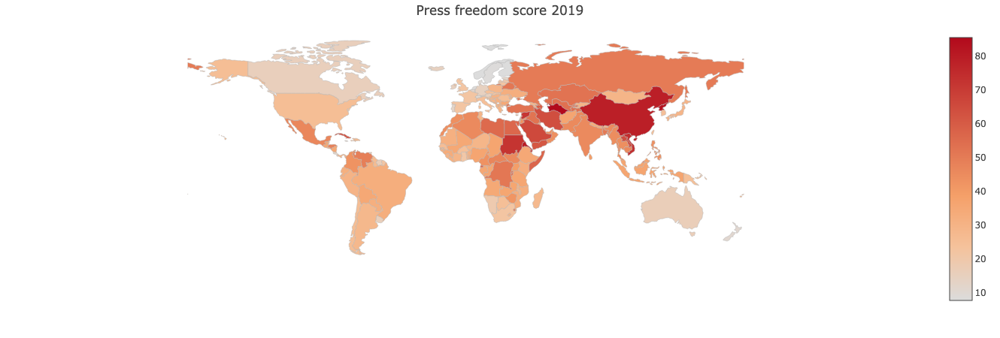

In [114]:
data = [go.Choropleth(
    locations = df['EN_country'],
    locationmode = 'country names',
    z = df['Score 2019'],
    text = df['Score 2019'],
    colorscale='Reds',
    autocolorscale = False,
    reversescale = False,
    marker = go.choropleth.Marker(
        line = go.choropleth.marker.Line(
            color = 'rgb(180,180,180)',
            width = 0.5
        )),
)]

layout = go.Layout(
    title = 'Press freedom score 2019',
    margin=dict(
        l=10,
        r=10,
        t=40,
        b=40
    ),
    geo = go.layout.Geo(
        showframe = False,
        showcoastlines = False,
        projection = go.layout.geo.Projection(
            type = 'equirectangular'
        )
    ),
)

fig = dict(data=data, layout=layout )
iplot(fig)


In [133]:
datafile1= './press_freedom2.csv'
df_ = pd.read_csv(datafile1)

# datafile2= './FOTP.xlsx'
# df1 = pd.read_excel(datafile2)
# df1.sample(2)
df9 = df_[df_['Year Covered'] == 2009]
df9.sample(2)

,Country,Edition,Total Score,Status,Year Covered
1233,Egypt,2010,60.0,PF,2009
1113,Denmark,2010,11.0,F,2009


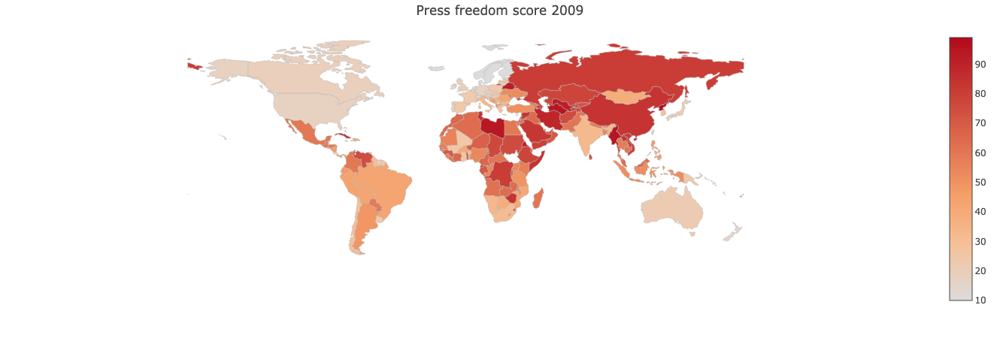

In [134]:
data = [go.Choropleth(
    locations = df9['Country'],
    locationmode = 'country names',
    z = df9['Total Score'],
    text = df9['Total Score'],
    colorscale='Reds',
    autocolorscale = False,
    reversescale = False,
    marker = go.choropleth.Marker(
        line = go.choropleth.marker.Line(
            color = 'rgb(180,180,180)',
            width = 0.5
        )),
)]

layout = go.Layout(
    title = 'Press freedom score 2009',
    margin=dict(
        l=10,
        r=10,
        t=40,
        b=40
    ),
    geo = go.layout.Geo(
        showframe = False,
        showcoastlines = False,
        projection = go.layout.geo.Projection(
            type = 'equirectangular'
        )
    ),
)

fig = dict(data=data, layout=layout )
iplot(fig)


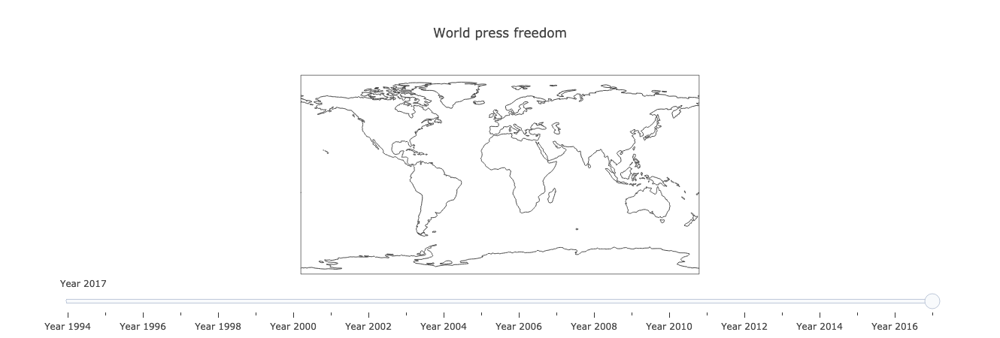

In [125]:
year = 1994

# your color-scale
scl = [[0.0, '#ffffff'],[0.2, '#b4a8ce'],[0.4, '#8573a9'],
       [0.6, '#7159a3'],[0.8, '#5732a1'],[1.0, '#2c0579']] # purples

data_slider = []
for year in df_['Year Covered'].unique():
    df_ =  df_[(df_['Year Covered']== year)]

    for col in df_.columns:
        df_[col] = df_[col].astype(str)

    data_each_yr = dict(
                        type='choropleth',
                        locations = df_['Country'],
                        z=df_['Total Score'].astype(float),
                        locationmode='country names',
                        colorscale = scl,
                        colorbar= {'title':'Score'})

    data_slider.append(data_each_yr)

steps = []
for i in range(len(data_slider)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data_slider)],
                label='Year {}'.format(i + 1994))
    step['args'][1][i] = True
    steps.append(step)


sliders = [dict(active=0, pad={"t": 1}, steps=steps)]

layout = dict(title ='World press freedom', geo=dict(scope='world',
                       projection={'type': 'equirectangular'}),
              sliders=sliders)

fig = dict(data=data_slider, layout=layout)
iplot(fig)